In [2]:
!pip install tqdm

In [3]:
from tqdm import tqdm
from PIL import Image
from glob import glob
from time import time
import numpy as np
from keras_segmentation.pretrained import pspnet_50_ADE_20K 

In [4]:
model = pspnet_50_ADE_20K() # load the pretrained model trained on ADE20k dataset

In [5]:
 files = glob('sidewalk/*')

In [6]:
t1 = []

In [8]:
for iteration, file in tqdm(enumerate(files),total=len(files)):
    t = time()
    out = model.predict_segmentation(
    inp=file,
    out_fname=f"Output/output_ADE20k_{iteration}.png"
)
    t1.append( time() - t)
    img = Image.open(f"Output/output_ADE20k_{iteration}.png").copy()
    background = Image.open(f"{file}").copy()
    blended = Image.blend(img,background.rotate(-90,expand=True), alpha=0.5)
    blended.save(f"Output/output_ADE20k_overlay_{iteration}.png","PNG")
    

100%|██████████████████████████████████████████████████████████████████████████████████| 14/14 [04:12<00:00, 18.07s/it]


In [9]:
blended = Image.blend(img,background.rotate(-90,expand=True), alpha=0.5)

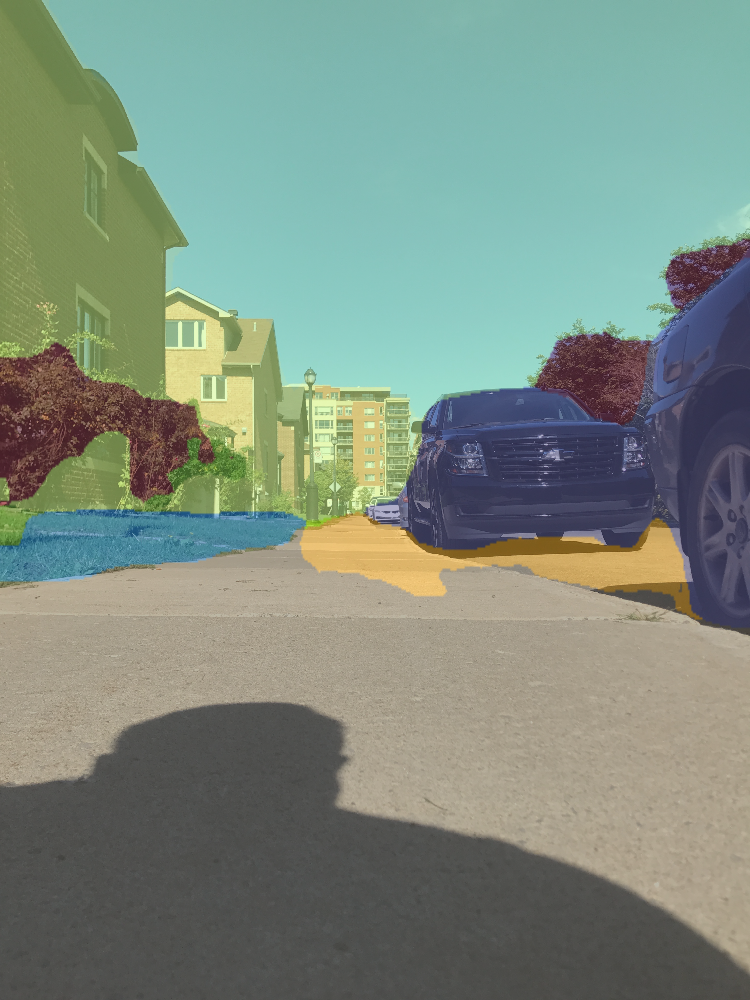

In [10]:
blended

In [11]:
t1

[32.5066339969635,
 10.896017074584961,
 10.967410326004028,
 10.79234766960144,
 10.749327421188354,
 10.802000284194946,
 10.77730679512024,
 10.767945051193237,
 10.77690052986145,
 11.027269124984741,
 10.697792530059814,
 10.757254838943481,
 10.879093885421753,
 10.833094596862793]

In [28]:
record = open("Record.txt", "w")
record.write("time in seconds for each input file : \n")
for iteration, x in enumerate(t1): 
    record.write(str(iteration) +" " + str(x)+ "\n")

0 32.5066339969635

1 10.896017074584961

2 10.967410326004028

3 10.79234766960144

4 10.749327421188354

5 10.802000284194946

6 10.77730679512024

7 10.767945051193237

8 10.77690052986145

9 11.027269124984741

10 10.697792530059814

11 10.757254838943481

12 10.879093885421753

13 10.833094596862793

